In [1]:

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# 1. Chargement
df = pd.read_csv("CSV_Base/factory_sensor_simulator_2040.csv")

In [3]:
df.shape

(500000, 22)

In [4]:
# 2. Cible à prédire (ex : Failure ou autre selon le dataset)
print(df.columns)  # Pour voir les colonnes disponibles

Index(['Machine_ID', 'Machine_Type', 'Installation_Year', 'Operational_Hours',
       'Temperature_C', 'Vibration_mms', 'Sound_dB', 'Oil_Level_pct',
       'Coolant_Level_pct', 'Power_Consumption_kW',
       'Last_Maintenance_Days_Ago', 'Maintenance_History_Count',
       'Failure_History_Count', 'AI_Supervision', 'Error_Codes_Last_30_Days',
       'Remaining_Useful_Life_days', 'Failure_Within_7_Days',
       'Laser_Intensity', 'Hydraulic_Pressure_bar', 'Coolant_Flow_L_min',
       'Heat_Index', 'AI_Override_Events'],
      dtype='object')


In [5]:
# 3. Visualisation du dataframe

df

,Machine_ID,Machine_Type,Installation_Year,Operational_Hours,Temperature_C,Vibration_mms,Sound_dB,Oil_Level_pct,Coolant_Level_pct,Power_Consumption_kW,...,Failure_History_Count,AI_Supervision,Error_Codes_Last_30_Days,Remaining_Useful_Life_days,Failure_Within_7_Days,Laser_Intensity,Hydraulic_Pressure_bar,Coolant_Flow_L_min,Heat_Index,AI_Override_Events
0,MC_000000,Mixer,2027,81769,73.43,12.78,83.72,36.76,68.74,84.95,...,5,True,3,162.0,False,NaN,NaN,NaN,NaN,2
1,MC_000001,Industrial_Chiller,2032,74966,58.32,14.99,77.04,100.00,62.13,154.61,...,2,True,4,147.0,False,NaN,NaN,40.92,NaN,2
2,MC_000002,Pick_and_Place,2003,94006,49.63,23.78,69.08,42.96,35.96,51.90,...,1,True,6,0.0,True,NaN,NaN,NaN,NaN,2
3,MC_000003,Vision_System,2007,76637,63.73,12.38,85.58,94.90,48.94,75.61,...,1,False,4,161.0,False,NaN,NaN,NaN,NaN,0
4,MC_000004,Shuttle_System,2016,20870,42.77,4.42,96.72,47.56,53.78,224.93,...,2,False,1,765.0,False,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,MC_499995,Vacuum_Packer,2011,14425,65.42,16.50,81.95,59.21,73.67,255.87,...,3,False,0,820.0,False,NaN,NaN,NaN,NaN,0
499996,MC_499996,Conveyor_Belt,2003,75501,44.83,12.88,64.94,73.69,29.25,198.37,...,1,False,4,34.0,False,NaN,NaN,NaN,NaN,0
499997,MC_499997,CMM,2039,19855,37.26,11.46,70.70,70.70,49.04,156.59,...,2,False,4,815.0,False,NaN,NaN,NaN,NaN,0
499998,MC_499998,Dryer,2035,86823,67.72,16.76,77.45,97.00,15.40,132.33,...,2,True,0,99.0,False,NaN,NaN,NaN,NaN,2


In [6]:
# 4. Visualisation des statistiques des colonnes numeriques

df.describe()

,Installation_Year,Operational_Hours,Temperature_C,Vibration_mms,Sound_dB,Oil_Level_pct,Coolant_Level_pct,Power_Consumption_kW,Last_Maintenance_Days_Ago,Maintenance_History_Count,Failure_History_Count,Error_Codes_Last_30_Days,Remaining_Useful_Life_days,Laser_Intensity,Hydraulic_Pressure_bar,Coolant_Flow_L_min,Heat_Index,AI_Override_Events
count,500000.000000,500000.000000,500000.000000,500000.00000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,15156.000000,30340.000000,45624.000000,45214.000000,500000.000000
mean,2019.962360,50012.424764,59.997682,9.99114,75.003477,69.456568,64.114159,149.922161,182.257866,5.003128,2.000588,3.000840,452.422338,74.995513,119.917514,39.984794,499.760966,0.602098
std,11.829812,28861.849078,14.986973,4.99953,9.990791,18.847444,23.152998,79.955937,105.552537,2.238043,1.413087,1.730541,288.971269,10.035133,15.017048,9.989653,50.012057,1.203647
min,2000.000000,0.000000,-15.730000,-17.82000,23.650000,0.000000,0.000000,-222.740000,0.000000,0.000000,0.000000,0.000000,0.000000,34.970000,52.680000,-0.160000,296.440000,0.000000
25%,2010.000000,25055.000000,49.890000,6.62000,68.270000,56.540000,48.130000,96.090000,91.000000,3.000000,1.000000,2.000000,200.000000,68.250000,109.820000,33.200000,465.940000,0.000000
50%,2020.000000,49973.000000,60.000000,10.00000,75.000000,70.030000,65.010000,149.950000,182.000000,5.000000,2.000000,3.000000,451.000000,74.950000,119.860000,40.030000,499.770000,0.000000
75%,2030.000000,74995.000000,70.050000,13.36000,81.730000,83.540000,81.840000,203.900000,274.000000,6.000000,3.000000,4.000000,700.000000,81.682500,130.072500,46.750000,533.307500,1.000000
max,2040.000000,100000.000000,127.330000,32.47000,120.700000,100.000000,100.000000,544.200000,365.000000,18.000000,12.000000,13.000000,1133.000000,114.320000,185.380000,80.790000,694.170000,11.000000


In [7]:
# 5. Visualisation des differendes machines de la colonne Machine_Type

df["Machine_Type"].unique()

array(['Mixer', 'Industrial_Chiller', 'Pick_and_Place', 'Vision_System',
       'Shuttle_System', 'Labeler', 'Automated_Screwdriver',
       'Shrink_Wrapper', 'Laser_Cutter', 'CMM', 'CNC_Lathe', 'Dryer',
       'Valve_Controller', 'Furnace', 'Carton_Former', 'Hydraulic_Press',
       'Compressor', 'AGV', 'Robot_Arm', 'Conveyor_Belt',
       'Forklift_Electric', 'Press_Brake', 'Boiler', 'Vacuum_Packer',
       'XRay_Inspector', 'Crane', '3D_Printer', 'Palletizer', 'Grinder',
       'CNC_Mill', 'Injection_Molder', 'Heat_Exchanger', 'Pump'],
      dtype=object)

In [8]:
# 6. Visualisation des types de colonne et s'il y a des valeurs nuls

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 22 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Machine_ID                  500000 non-null  object 
 1   Machine_Type                500000 non-null  object 
 2   Installation_Year           500000 non-null  int64  
 3   Operational_Hours           500000 non-null  int64  
 4   Temperature_C               500000 non-null  float64
 5   Vibration_mms               500000 non-null  float64
 6   Sound_dB                    500000 non-null  float64
 7   Oil_Level_pct               500000 non-null  float64
 8   Coolant_Level_pct           500000 non-null  float64
 9   Power_Consumption_kW        500000 non-null  float64
 10  Last_Maintenance_Days_Ago   500000 non-null  int64  
 11  Maintenance_History_Count   500000 non-null  int64  
 12  Failure_History_Count       500000 non-null  int64  
 13  AI_Supervision

In [9]:
# 7. Visualisation des colonnes avec des valeurs nuls

df.isna().sum()

Machine_ID                         0
Machine_Type                       0
Installation_Year                  0
Operational_Hours                  0
Temperature_C                      0
Vibration_mms                      0
Sound_dB                           0
Oil_Level_pct                      0
Coolant_Level_pct                  0
Power_Consumption_kW               0
Last_Maintenance_Days_Ago          0
Maintenance_History_Count          0
Failure_History_Count              0
AI_Supervision                     0
Error_Codes_Last_30_Days           0
Remaining_Useful_Life_days         0
Failure_Within_7_Days              0
Laser_Intensity               484844
Hydraulic_Pressure_bar        469660
Coolant_Flow_L_min            454376
Heat_Index                    454786
AI_Override_Events                 0
dtype: int64

In [10]:
# 8. Suppression des doublons

df.drop_duplicates()

,Machine_ID,Machine_Type,Installation_Year,Operational_Hours,Temperature_C,Vibration_mms,Sound_dB,Oil_Level_pct,Coolant_Level_pct,Power_Consumption_kW,...,Failure_History_Count,AI_Supervision,Error_Codes_Last_30_Days,Remaining_Useful_Life_days,Failure_Within_7_Days,Laser_Intensity,Hydraulic_Pressure_bar,Coolant_Flow_L_min,Heat_Index,AI_Override_Events
0,MC_000000,Mixer,2027,81769,73.43,12.78,83.72,36.76,68.74,84.95,...,5,True,3,162.0,False,NaN,NaN,NaN,NaN,2
1,MC_000001,Industrial_Chiller,2032,74966,58.32,14.99,77.04,100.00,62.13,154.61,...,2,True,4,147.0,False,NaN,NaN,40.92,NaN,2
2,MC_000002,Pick_and_Place,2003,94006,49.63,23.78,69.08,42.96,35.96,51.90,...,1,True,6,0.0,True,NaN,NaN,NaN,NaN,2
3,MC_000003,Vision_System,2007,76637,63.73,12.38,85.58,94.90,48.94,75.61,...,1,False,4,161.0,False,NaN,NaN,NaN,NaN,0
4,MC_000004,Shuttle_System,2016,20870,42.77,4.42,96.72,47.56,53.78,224.93,...,2,False,1,765.0,False,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,MC_499995,Vacuum_Packer,2011,14425,65.42,16.50,81.95,59.21,73.67,255.87,...,3,False,0,820.0,False,NaN,NaN,NaN,NaN,0
499996,MC_499996,Conveyor_Belt,2003,75501,44.83,12.88,64.94,73.69,29.25,198.37,...,1,False,4,34.0,False,NaN,NaN,NaN,NaN,0
499997,MC_499997,CMM,2039,19855,37.26,11.46,70.70,70.70,49.04,156.59,...,2,False,4,815.0,False,NaN,NaN,NaN,NaN,0
499998,MC_499998,Dryer,2035,86823,67.72,16.76,77.45,97.00,15.40,132.33,...,2,True,0,99.0,False,NaN,NaN,NaN,NaN,2


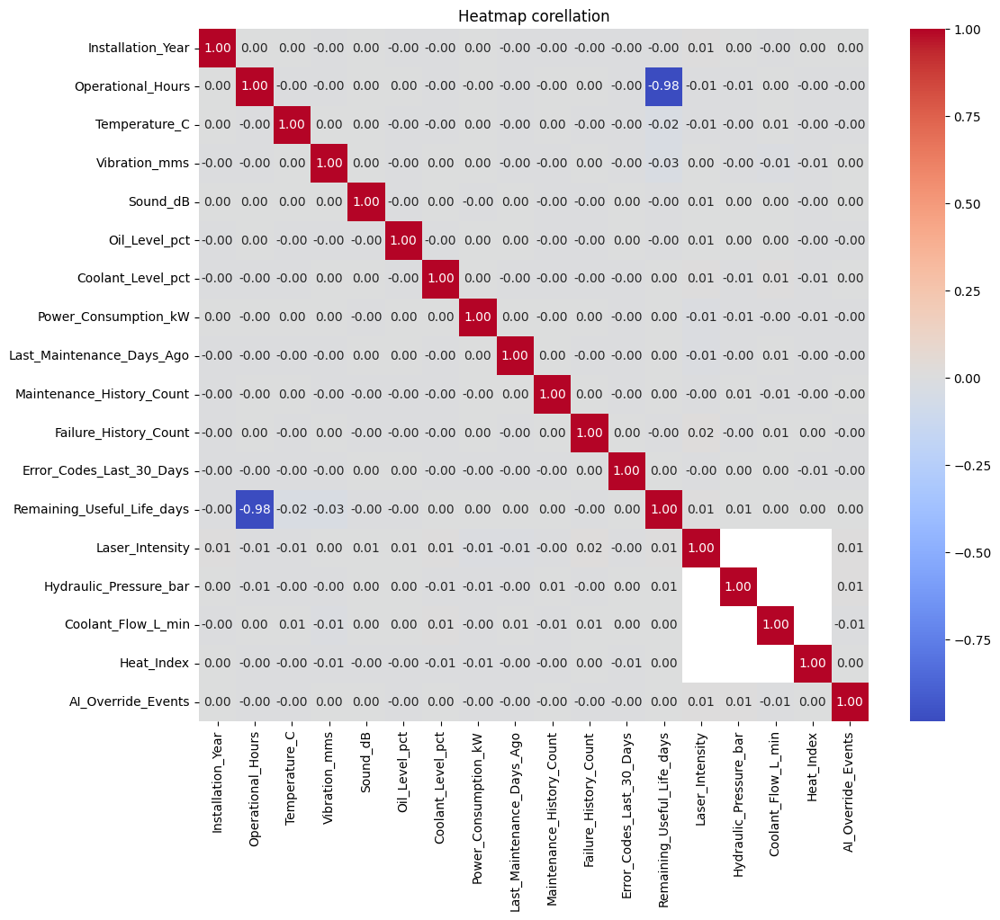

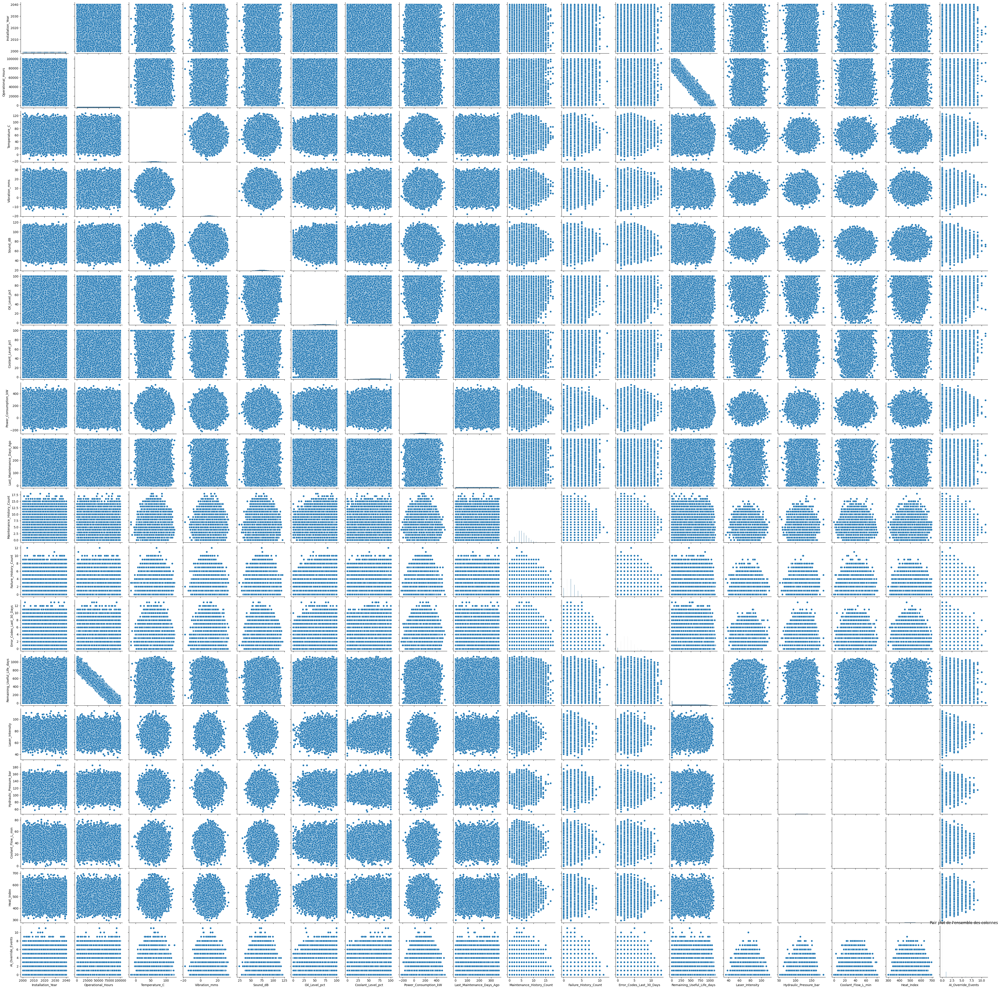

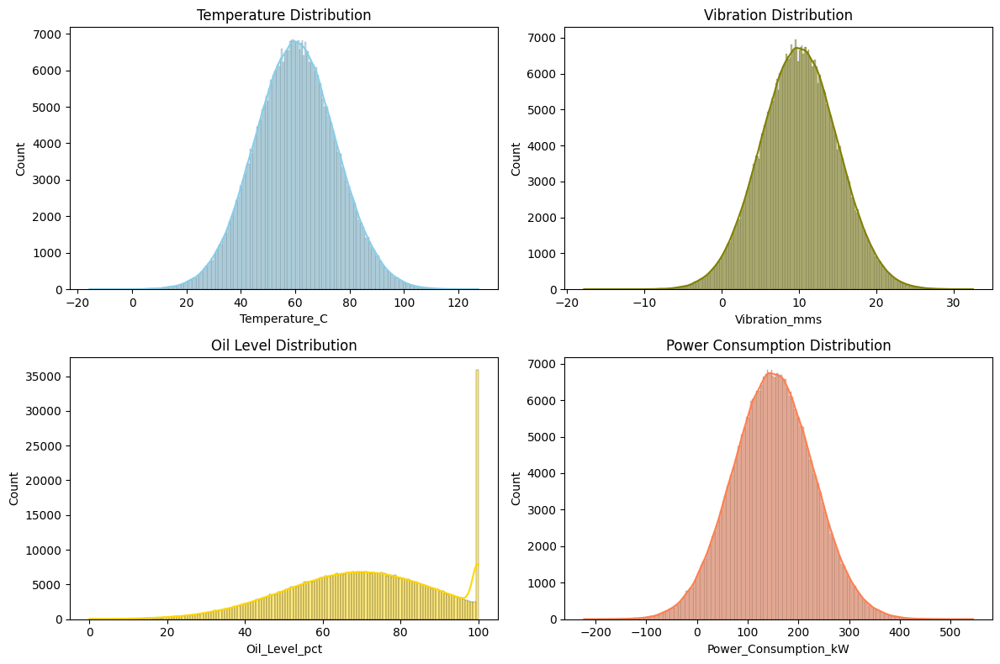

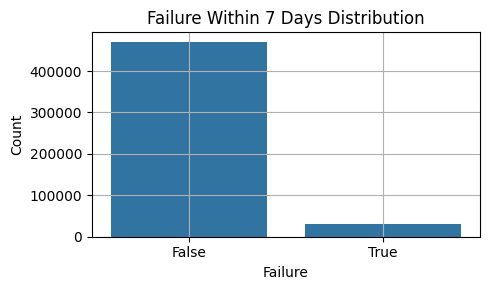

In [11]:
# Selection des colonnes numeriques pour la création de la heatmap
numeric_df = df.select_dtypes(include=[np.number])

# Heatmap
plt.figure(figsize=(12, 10))
corr = numeric_df.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Heatmap corellation')
plt.show()

# Pair Plot pour voir les distributions
sample_features = numeric_df.columns
sns.pairplot(df[sample_features])
plt.title("Pair plot de l'ensemble des colonnes")
plt.show()

# Histograms Temperature, Vibration, niveau d'huile, Consommation
fig, ax = plt.subplots(2, 2, figsize=(12,8))
sns.histplot(df['Temperature_C'], ax=ax[0,0], kde=True, color='skyblue')
ax[0,0].set_title('Temperature Distribution')

sns.histplot(df['Vibration_mms'], ax=ax[0,1], kde=True, color='olive')
ax[0,1].set_title('Vibration Distribution')

sns.histplot(df['Oil_Level_pct'], ax=ax[1,0], kde=True, color='gold')
ax[1,0].set_title('Oil Level Distribution')

sns.histplot(df['Power_Consumption_kW'], ax=ax[1,1], kde=True, color='coral')
ax[1,1].set_title('Power Consumption Distribution')

plt.tight_layout()
plt.show()

# Distribution defaillance durant les 7 derniers jours
plt.figure(figsize=(5, 3))
sns.countplot(x="Failure_Within_7_Days", data=df)
plt.title("Failure Within 7 Days Distribution")
plt.xlabel("Failure")
plt.ylabel("Count")
plt.grid(True)
plt.tight_layout()
plt.show()

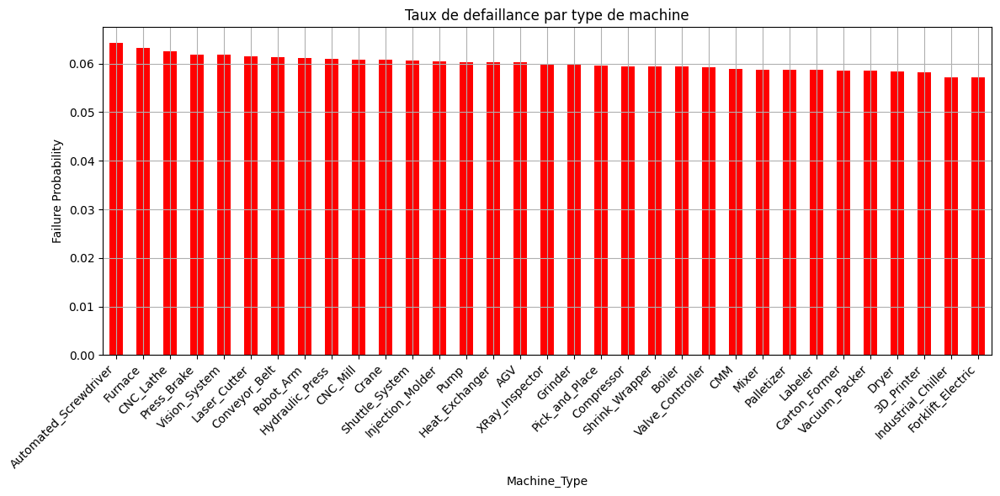

In [12]:
# Risque defaillance par type de machine
failure_by_type = df.groupby("Machine_Type")["Failure_Within_7_Days"].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
failure_by_type.plot(kind="bar", color="red")
plt.title("Taux de defaillance par type de machine")
plt.ylabel("Failure Probability")
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()
plt.show()

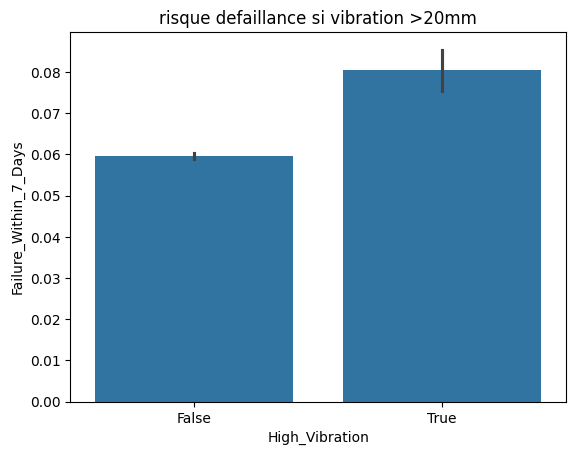

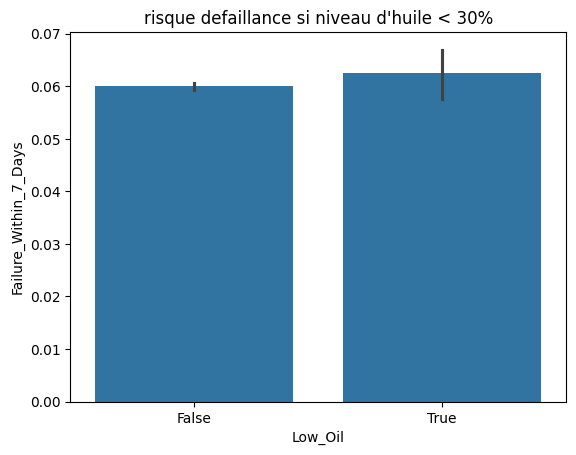

In [13]:
# --- Feature Engineering: Binary Threshold Flags ---
df["High_Vibration"] = df["Vibration_mms"] > 20
df["Low_Oil"] = df["Oil_Level_pct"] < 30
sns.barplot(x="High_Vibration", y="Failure_Within_7_Days", data=df)
plt.title("risque defaillance si vibration >20mm")
plt.show()

sns.barplot(x="Low_Oil", y="Failure_Within_7_Days", data=df)
plt.title("risque defaillance si niveau d'huile < 30%")
plt.show()

In [14]:
#Creation d'une copie df2 pour entrainer un model ML
df2 = df.copy()

# Check des valeurs manquantes
missing_vals = df2.isnull().sum()
print("Valeurs manquantes par colonne:\n", missing_vals)

Valeurs manquantes par colonne:
 Machine_ID                         0
Machine_Type                       0
Installation_Year                  0
Operational_Hours                  0
Temperature_C                      0
Vibration_mms                      0
Sound_dB                           0
Oil_Level_pct                      0
Coolant_Level_pct                  0
Power_Consumption_kW               0
Last_Maintenance_Days_Ago          0
Maintenance_History_Count          0
Failure_History_Count              0
AI_Supervision                     0
Error_Codes_Last_30_Days           0
Remaining_Useful_Life_days         0
Failure_Within_7_Days              0
Laser_Intensity               484844
Hydraulic_Pressure_bar        469660
Coolant_Flow_L_min            454376
Heat_Index                    454786
AI_Override_Events                 0
High_Vibration                     0
Low_Oil                            0
dtype: int64


In [15]:
# Change les valeurs manquantes par la moyenne des valeurs de la colonne
numeric_cols = df2.select_dtypes(include=[np.number]).columns
imputer = SimpleImputer(strategy='mean')
df2[numeric_cols] = imputer.fit_transform(df2[numeric_cols])

# Verifie qu'il n'y a plus de valeur manquante
print("Apres modification, valeurs manquantes par colonne:\n", df2.isnull().sum())

Apres modification, valeurs manquantes par colonne:
 Machine_ID                    0
Machine_Type                  0
Installation_Year             0
Operational_Hours             0
Temperature_C                 0
Vibration_mms                 0
Sound_dB                      0
Oil_Level_pct                 0
Coolant_Level_pct             0
Power_Consumption_kW          0
Last_Maintenance_Days_Ago     0
Maintenance_History_Count     0
Failure_History_Count         0
AI_Supervision                0
Error_Codes_Last_30_Days      0
Remaining_Useful_Life_days    0
Failure_Within_7_Days         0
Laser_Intensity               0
Hydraulic_Pressure_bar        0
Coolant_Flow_L_min            0
Heat_Index                    0
AI_Override_Events            0
High_Vibration                0
Low_Oil                       0
dtype: int64


In [16]:
# --- Model de prédiction : Random Forest Classifier ---
print("\n--- Model Random Forest Classification ---")
features = df2.select_dtypes(include=[np.number]).drop(columns=["Remaining_Useful_Life_days", "Failure_Within_7_Days"], errors="ignore")
target = df2["Failure_Within_7_Days"]
X = features
y = target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
cm=confusion_matrix(y_test, y_pred)
TN, FP, FN, TP = cm.ravel()

print("--- Matrice de confusion ---")
print(f"Vrai Négatif (TN) : {TN} -> prédits 0 quand c'était 0 (pas de panne)")
print(f"Faux Positif (FP) : {FP} -> prédits 1 alors que c'était 0 (fausse alerte)")
print(f"Faux Négatif (FN) : {FN} -> prédits 0 alors que c'était 1 (panne non détectée)")
print(f"Vrai Positif (TP) : {TP} -> prédits 1 quand c'était 1 (panne bien détectée)")
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))


--- Model Random Forest Classification ---
--- Matrice de confusion ---
Vrai Négatif (TN) : 92456 -> prédits 0 quand c'était 0 (pas de panne)
Faux Positif (FP) : 1584 -> prédits 1 alors que c'était 0 (fausse alerte)
Faux Négatif (FN) : 2072 -> prédits 0 alors que c'était 1 (panne non détectée)
Vrai Positif (TP) : 3888 -> prédits 1 quand c'était 1 (panne bien détectée)

Classification Report:
               precision    recall  f1-score   support

       False       0.98      0.98      0.98     94040
        True       0.71      0.65      0.68      5960

    accuracy                           0.96    100000
   macro avg       0.84      0.82      0.83    100000
weighted avg       0.96      0.96      0.96    100000


Accuracy: 0.96344
